#Waymo Open Dataset 3D Semantic Segmentation Tutorial

- Website: https://waymo.com/open
- GitHub: https://github.com/waymo-research/waymo-open-dataset

This tutorial demonstrates how to decode and interpret the 3D semantic segmentation labels. Visit the [Waymo Open Dataset Website](https://waymo.com/open) to download the full dataset.

To use, open this notebook in [Colab](https://colab.research.google.com).

Uncheck the box "Reset all runtimes before running" if you run this colab directly from the remote kernel. Alternatively, you can make a copy before trying to run it by following "File > Save copy in Drive ...".



# Package Installation

Package installation
Please follow the instructions in [tutorial.ipynb](https://github.com/waymo-research/waymo-open-dataset/blob/master/tutorial/tutorial.ipynb).

# Imports and global definitions

In [1]:
# Data location. Please edit.

# A tfrecord containing tf.Example protos as downloaded from the Waymo dataset
# webpage.

# Replace this path with your own tfrecords.
FILENAME = '/content/waymo-od/tutorial/.../tfexample.tfrecord'
FILENAME = '/data0/2022/data/waymo/data/segment-3451017128488170637_5280_000_5300_000_with_camera_labels.tfrecord'
FILENAME = '/data2/data/waymo/training/segment-10241508783381919015_2889_360_2909_360_with_camera_labels.tfrecord'

In [2]:
import os
import matplotlib.pyplot as plt
import tensorflow.compat.v1 as tf
import numpy as np

tf.enable_eager_execution()

from waymo_open_dataset import dataset_pb2 as open_dataset
from waymo_open_dataset.utils import frame_utils

# Read 3D semantic segmentation labels from Frame proto

In [3]:
dataset = tf.data.TFRecordDataset(FILENAME, compression_type='')
for data in dataset:
    frame = open_dataset.Frame()
    frame.ParseFromString(bytearray(data.numpy()))
    # if frame.lasers[0].ri_return1.segmentation_label_compressed:
    # if hasattr(frame.lasers[0].ri_return1, 'segmentation_label_compressed'):
    if len(frame.lasers[0].ri_return1.segmentation_label_compressed) > 0:
      print("find")
      break

2022-04-28 15:52:34.374202: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudnn.so.8'; dlerror: libcudnn.so.8: cannot open shared object file: No such file or directory
2022-04-28 15:52:34.374250: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1835] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
2022-04-28 15:52:34.375761: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-04-28 15:52:34.435676: I tens

find


In [4]:
print(frame.lasers[0].ri_return1.segmentation_label_compressed)

b'x\x9c\xed\xddK\xf3\xec\xb8y\xdf\xf1\xeel\x8ej\x163\xa3cI+;\x9e\x91S\x9a(*\xeb\xe6\xc4e-l\xcbN\xca\xe5r\xca\xa9DU\xc9:o9\xdb\xec\xf3:\x14\xf5\xe9\xd3\xe2\xa5\x01\xe2\xf6\x00\xf8\x01\xf8\xb2k\xce|\xfe}!A\x10\x04A\x12|\xf0\xc5\xff\xfb?\xff\xfb\xf66\xfd\xfe5\xdd\xbfx\xff0\xe9K\xb3N\xce\x95\xdf\xde\xfcjG\xff\'\xa7/\x15\xa7$\xb0E\x82\x89\x80\xcdh\xb0\xb5\xe3\n\xc2\xc5\x0fJ\'\x85|\x14\xe3\xc5&\xaa\xb7H\x7fR\xb4\xa6\x84D\xef\xf2\xd0\x93\x9d\xe1\x85\xd4,\xfau\xa6-\xc1_\x0e\xb2 wn\x07y5\xa3\x8a\xd5\xe8\xe9\x87\x99\xcb\x84P\xb9\x89\x10.\xfduj\xc6m\xa6_B\xf8%%\x02\xfa\xf8u}V\xac\x97\x1b,\x04B1*\xd4\x1b\x10B\x08!\x84\x10\xf6e\xadv5-~\xa8VR!\x94(\xca\x10\xc2\xa1\xc8\xdd \x08\xa1\x1e\x15\x1aU#3|?Ta\xd36.\x1ci7\x89\xed:\xe1D\xf5\xb2\x84\x10B\x08g$\xc7\xbdhZd\x15\xd9\xfd\xe2[\x0b\x0c~\xa2\xfb1\x10\x85\x94%\x96n\x93\x07U\x92\xbe<\xd6\x14\xbdj\xe5\xdb\x05B\x08aCz\x0f\x86\xc1g>%\x92\xef\xe6\xdb\x83\xa1\xd7O\'+$\x19B\x08awr@\x80\xb0\x0e\xd3/;$\x85!\xd91\xf12\x86\xf9Z\xe6\xfd4\xb1\x07\x96q\x1f\xac\xd4m\xa

In [5]:
print(frame.context.name)
print(frame.context.stats)

10241508783381919015_2889_360_2909_360
laser_object_counts {
  type: TYPE_VEHICLE
  count: 41
}
laser_object_counts {
  type: TYPE_PEDESTRIAN
  count: 12
}
laser_object_counts {
  type: TYPE_SIGN
  count: 31
}
time_of_day: "Night"
location: "location_phx"
weather: "sunny"
camera_object_counts {
  type: TYPE_VEHICLE
  count: 24
}
camera_object_counts {
  type: TYPE_PEDESTRIAN
  count: 6
}



In [6]:
(range_images, camera_projections, segmentation_labels,
 range_image_top_pose) = frame_utils.parse_range_image_and_camera_projection(
    frame)

In [7]:
print(segmentation_labels)

{1: [data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: -1
data: 10
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: -1
data: 10
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0
data: 0

In [ ]:
seg_label_str_tensor = tf.io.decode_compressed(
            frame.lasers[0].ri_return1.segmentation_label_compressed, 'ZLIB')

In [9]:
print(segmentation_labels[open_dataset.LaserName.TOP][0].shape.dims)

[64, 2650, 2]


In [10]:
type(segmentation_labels[open_dataset.LaserName.TOP][1])

waymo_open_dataset.dataset_pb2.MatrixInt32

# Visualize Segmentation Labels in Range Images

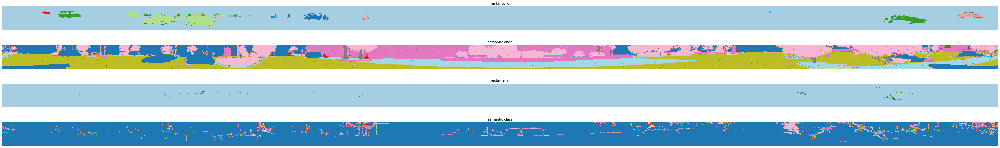

In [11]:
plt.figure(figsize=(64, 20))
def plot_range_image_helper(data, name, layout, vmin = 0, vmax=1, cmap='gray'):
  """Plots range image.

  Args:
    data: range image data
    name: the image title
    layout: plt layout
    vmin: minimum value of the passed data
    vmax: maximum value of the passed data
    cmap: color map
  """
  plt.subplot(*layout)
  plt.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
  plt.title(name)
  plt.grid(False)
  plt.axis('off')

def get_semseg_label_image(laser_name, return_index):
  """Returns semseg label image given a laser name and its return index."""
  return segmentation_labels[laser_name][return_index]

def show_semseg_label_image(semseg_label_image, layout_index_start = 1):
  """Shows range image.

  Args:
    show_semseg_label_image: the semseg label data of type MatrixInt32.
    layout_index_start: layout offset
  """
  semseg_label_image_tensor = tf.convert_to_tensor(semseg_label_image.data)
  semseg_label_image_tensor = tf.reshape(
      semseg_label_image_tensor, semseg_label_image.shape.dims)
  instance_id_image = semseg_label_image_tensor[...,0] 
  semantic_class_image = semseg_label_image_tensor[...,1]
  plot_range_image_helper(instance_id_image.numpy(), 'instance id',
                   [8, 1, layout_index_start], vmin=-1, vmax=200, cmap='Paired')
  plot_range_image_helper(semantic_class_image.numpy(), 'semantic class',
                   [8, 1, layout_index_start + 1], vmin=0, vmax=22, cmap='tab20')

frame.lasers.sort(key=lambda laser: laser.name)
show_semseg_label_image(get_semseg_label_image(open_dataset.LaserName.TOP, 0), 1)
show_semseg_label_image(get_semseg_label_image(open_dataset.LaserName.TOP, 1), 3)

# Point Cloud Conversion and Visualization

In [16]:
def convert_range_image_to_point_cloud_labels(frame,
                                              range_images,
                                              segmentation_labels,
                                              ri_index=0):
  """Convert segmentation labels from range images to point clouds.

  Args:
    frame: open dataset frame
    range_images: A dict of {laser_name, [range_image_first_return,
       range_image_second_return]}.
    segmentation_labels: A dict of {laser_name, [range_image_first_return,
       range_image_second_return]}.
    ri_index: 0 for the first return, 1 for the second return.

  Returns:
    point_labels: {[N, 2]} list of 3d lidar points's segmentation labels. 0 for
      points that are not labeled.
  """
  calibrations = sorted(frame.context.laser_calibrations, key=lambda c: c.name)
  point_labels = []
  for c in calibrations:
    range_image = range_images[c.name][ri_index]
    range_image_tensor = tf.reshape(
        tf.convert_to_tensor(range_image.data), range_image.shape.dims)
    range_image_mask = range_image_tensor[..., 0] > 0

    if c.name in segmentation_labels:
      sl = segmentation_labels[c.name][ri_index]
      sl_tensor = tf.reshape(tf.convert_to_tensor(sl.data), sl.shape.dims)
      sl_points_tensor = tf.gather_nd(sl_tensor, tf.where(range_image_mask))
    else:
      num_valid_point = tf.math.reduce_sum(tf.cast(range_image_mask, tf.int32))
      sl_points_tensor = tf.zeros([num_valid_point, 2], dtype=tf.int32)
      
    point_labels.append(sl_points_tensor.numpy())
  return point_labels

In [17]:
points, cp_points = frame_utils.convert_range_image_to_point_cloud(
    frame, range_images, camera_projections, range_image_top_pose)
points_ri2, cp_points_ri2 = frame_utils.convert_range_image_to_point_cloud(
    frame, range_images, camera_projections, range_image_top_pose, ri_index=1)

In [18]:
point_labels = convert_range_image_to_point_cloud_labels(
    frame, range_images, segmentation_labels)
point_labels_ri2 = convert_range_image_to_point_cloud_labels(
    frame, range_images, segmentation_labels, ri_index=1)

In [19]:
# 3d points in vehicle frame.
points_all = np.concatenate(points, axis=0)
points_all_ri2 = np.concatenate(points_ri2, axis=0)
# point labels.
point_labels_all = np.concatenate(point_labels, axis=0)
point_labels_all_ri2 = np.concatenate(point_labels_ri2, axis=0)
# camera projection corresponding to each point.
cp_points_all = np.concatenate(cp_points, axis=0)
cp_points_all_ri2 = np.concatenate(cp_points_ri2, axis=0)

###Show colored point cloud
Example of rendered point clouds (this tutorial does not have visualization capability).

In [20]:
from IPython.display import Image, display
display(Image('/content/waymo-od/tutorial/3d_semseg_points.png'))

FileNotFoundError: No such file or directory: '/content/waymo-od/tutorial/3d_semseg_points.png'

FileNotFoundError: No such file or directory: '/content/waymo-od/tutorial/3d_semseg_points.png'

<IPython.core.display.Image object>